In [1]:
!pip install opencv-python open3d numpy matplotlib

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 447.7/447.7 MB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.0/8.0 MB 47.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 9.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.8/139.8 kB 12.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 228.0/228.0 kB 18.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 214.0/214.0 kB 7.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 20.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 37.0 MB/s eta 0:00:00
  Attempting uninstall: widgetsnbextension
    Found existing installation: widgetsnbextension 3.6.10
    Uninstalling widgetsnbextension-3.6.10:
      Successfully uninstalled widgetsnbextension-3.6.10
  Attempting uninstall: werkzeug
    Found existing installation: Werkzeug 3.1.3
    Uninstalling Werkzeug-3.1.3:
      Successfully uninstalled Werkzeug-3.1.3
  At

In [3]:
import cv2
import numpy as np
import open3d as o3d
import matplotlib.pyplot as plt
from torchvision import models
import torch

### Clone the SoccerNet Camera Calibration repository

In [4]:
!git clone https://github.com/SoccerNet/sn-calibration

Cloning into 'sn-calibration'...
remote: Enumerating objects: 232, done.
remote: Counting objects: 100% (82/82), done.
remote: Compressing objects: 100% (34/34), done.
remote: Total 232 (delta 60), reused 53 (delta 48), pack-reused 150 (from 1)
Receiving objects: 100% (232/232), 2.68 MiB | 6.25 MiB/s, done.
Resolving deltas: 100% (131/131), done.


In [5]:
%cd sn-calibration

/content/sn-calibration


In [6]:
%cd src/

/content/sn-calibration/src


In [7]:
%ls

baseline_cameras.py  detect_extremities.py  evaluate_extremities.py
camera.py            evalai_camera.py       soccerpitch.py
dataloader.py        evaluate_camera.py


In [8]:
import os
print(os.listdir())

['soccerpitch.py', 'evaluate_extremities.py', 'dataloader.py', 'evalai_camera.py', 'evaluate_camera.py', 'camera.py', 'detect_extremities.py', 'baseline_cameras.py']


NOTE:
Download weights from https://github.com/SoccerNet/sn-calibration (do f1 "drive"to find link) and move inside resources

Go into src/detect_extremities.py (double clic to open editor on colab) and remove src from "from src.soccerpitch import SoccerPitch" and save.

In [9]:
from detect_extremities import SegmentationNetwork

In [10]:
seg_net = SegmentationNetwork(
    "../resources/soccer_pitch_segmentation.pth",
    "../resources/mean.npy",
    "../resources/std.npy"
)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 167MB/s]


In [11]:
from soccerpitch import SoccerPitch

lines_palette = [0, 0, 0]
for line_class in SoccerPitch.lines_classes:
  lines_palette.extend(SoccerPitch.palette[line_class])

NOTE: Move img1 and img2 to sn-calibration/images.

# Image 1

(548, 960, 3)


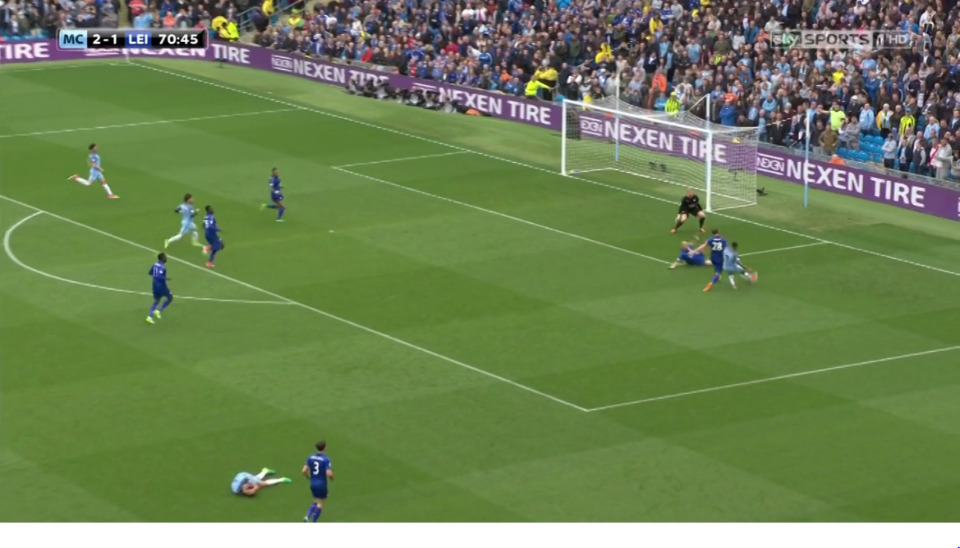

In [158]:
from PIL import Image
import cv2

image = cv2.imread("../images/img1.PNG")
image = cv2.resize(image, (960, 548))
print(image.shape)
rgbimage = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
pil_image = Image.fromarray(rgbimage)
pil_image

Use the segmentation model.

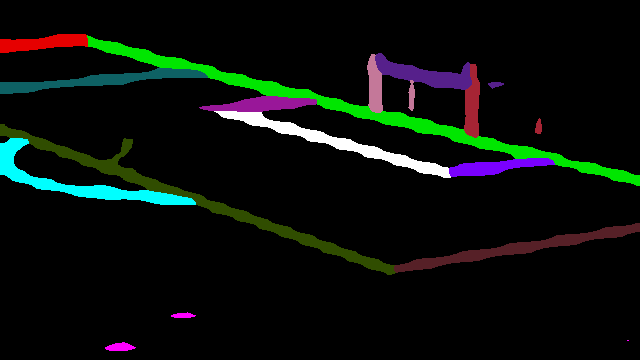

In [159]:
import numpy as np

seg_mask = seg_net.analyse_image(image)
mask = Image.fromarray(seg_mask.astype(np.uint8)).convert('P')
mask.putpalette(lines_palette)
mask

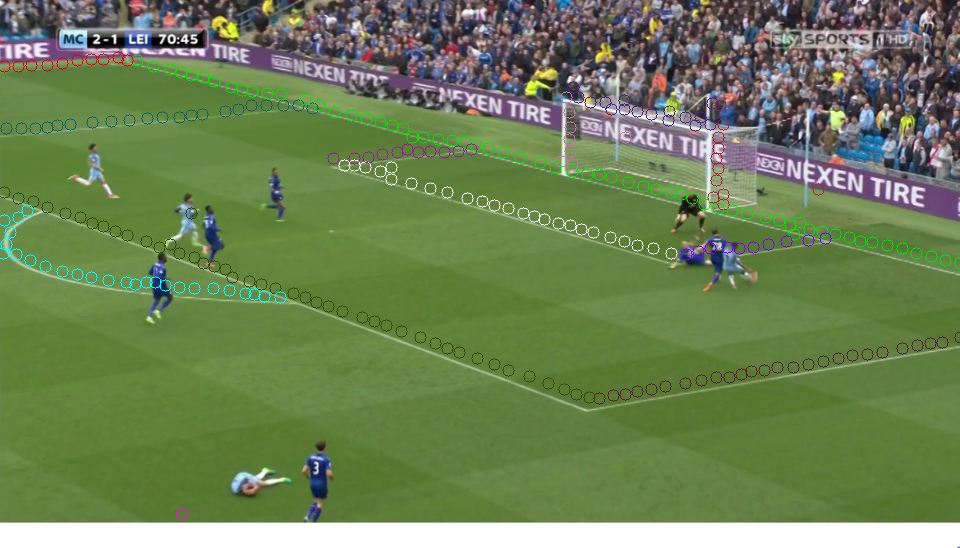

In [160]:
from detect_extremities import generate_class_synthesis, get_line_extremities

skeletons = generate_class_synthesis(seg_mask, 6)
circles_image = rgbimage.copy()
for k, circle_list in skeletons.items():
  color = SoccerPitch.palette[k]

  for circle_center in circle_list:
    cv2.circle(circles_image, (int(circle_center[1] * 548. / 360.), int(circle_center[0] * 960. / 648.)), 6, color, 1)

skeletons_image = Image.fromarray(circles_image)
skeletons_image

Get the start and end points.

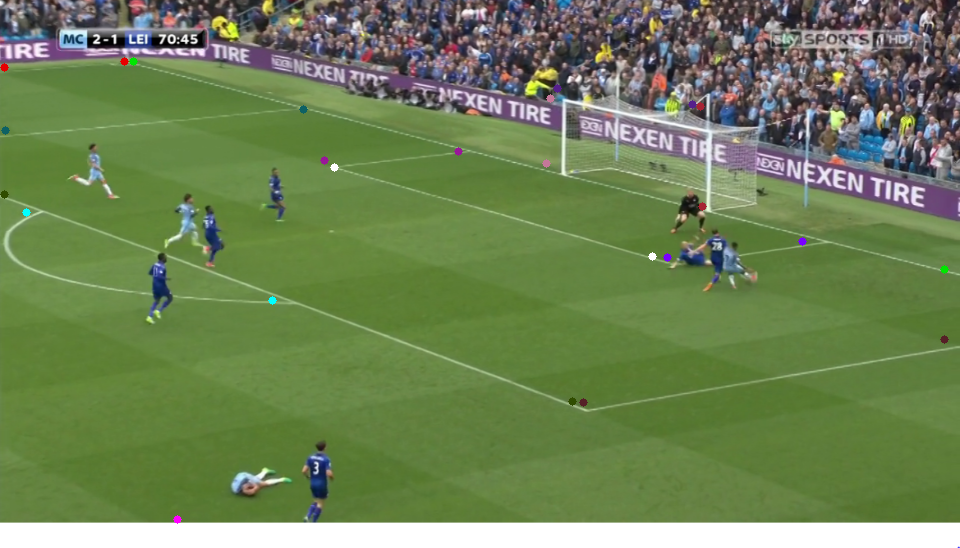

In [161]:
extremities_image = rgbimage.copy()
extremities = get_line_extremities(skeletons, 40, 648, 360)

for k, ends in extremities.items():
  color = SoccerPitch.palette[k]
  start = (int(ends[0]['x'] * 959.), int(ends[0]['y'] * 539.))
  end = (int(ends[1]['x'] * 959.), int(ends[1]['y'] * 539.))
  cv2.circle(extremities_image, start, 4, color, -1)
  cv2.circle(extremities_image, end, 4, color, -1)

extremities_pil = Image.fromarray(extremities_image)
extremities_pil

Go into src/camera.py (double clic to open editor on colab) and remove src. from "from src.soccerpitch import SoccerPitch" and save

### Regulatory pitch

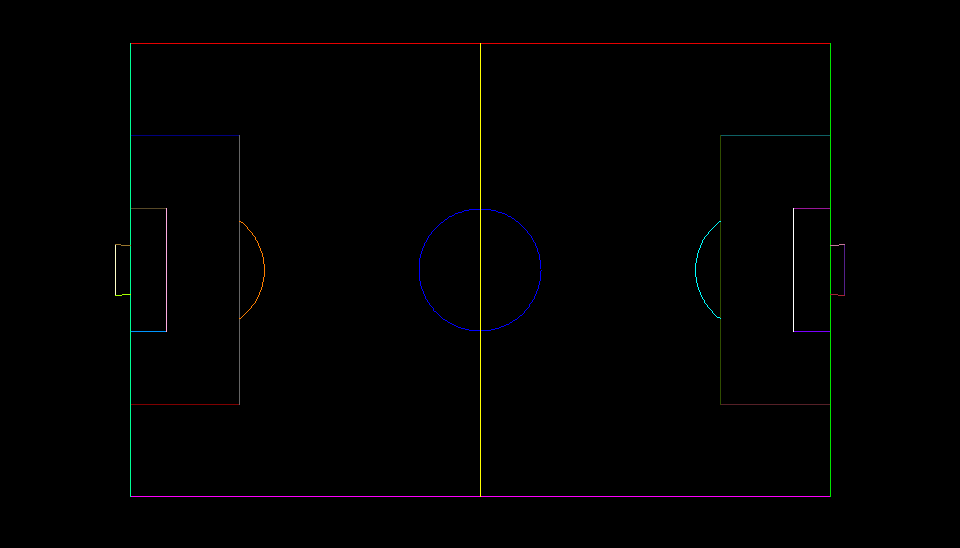

In [162]:
from camera import Camera

black_img = np.zeros((548, 960, 3), dtype=np.uint8)

camera = Camera()
camera.xfocal_length = 400
camera.yfocal_length = 400
camera.position = [0, 0, -60]
camera.draw_colorful_pitch(black_img, SoccerPitch.palette)
rgb_model = cv2.cvtColor(black_img, cv2.COLOR_BGR2RGB)
pitch_model = Image.fromarray(rgb_model)
pitch_model

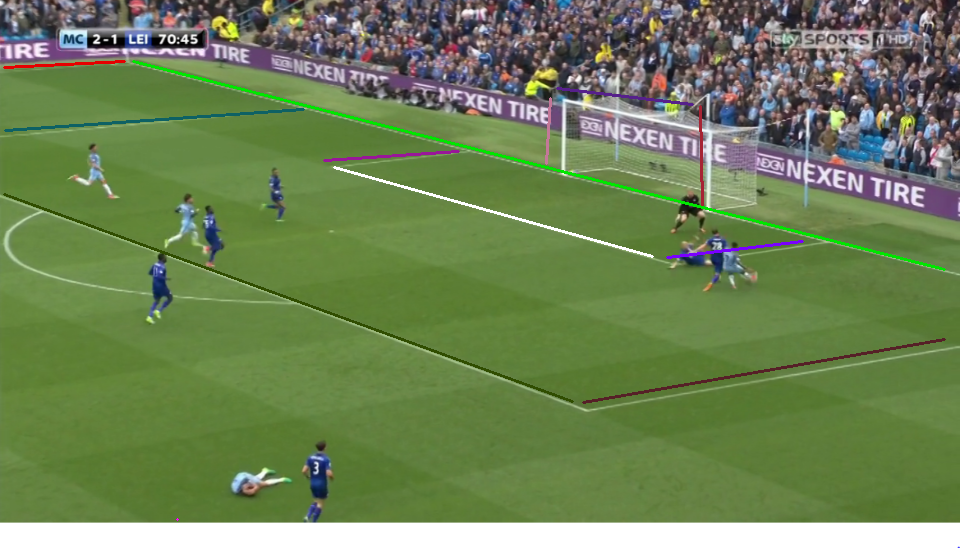

In [163]:
extremities_image = rgbimage.copy()
extremities = get_line_extremities(skeletons, 40, 648, 360)

pitch = SoccerPitch()
line_matches = []
for k, ends in extremities.items():
  if "Circle" in k:
    continue
  color = SoccerPitch.palette[k]
  start = (int(ends[0]['x'] * 959.), int(ends[0]['y'] * 539.))
  end = (int(ends[1]['x'] * 959.), int(ends[1]['y'] * 539.))
  cv2.line(extremities_image, start, end, color, 2)

  line = np.cross([start[0], start[1], 1], [end[0], end[1], 1])
  if np.isnan(np.sum(line)) or np.isinf(np.sum(line)):
    continue
  line_pitch = pitch.get_2d_homogeneous_line(k)
  if line_pitch is not None:
    line_matches.append((line_pitch, line))

extremities_pil = Image.fromarray(extremities_image)
extremities_pil

Compute homography from 3d pitch to 2D image.

In [164]:
def estimate_homography_from_line_correspondences(lines, T1=np.eye(3), T2=np.eye(3)):
    """
    Given lines correspondences, computes the homography that maps best the two set of lines.
    :param lines: list of pair of 2D lines matches.
    :param T1: Similarity transform to normalize the elements of the source reference system
    :param T2: Similarity transform to normalize the elements of the target reference system
    :return: boolean to indicate success or failure of the estimation, homography
    """
    homography = np.eye(3)
    A = np.zeros((len(lines) * 2, 9))

    for i, line_pair in enumerate(lines):
        src_line = np.transpose(np.linalg.inv(T1)) @ line_pair[0]
        target_line = np.transpose(np.linalg.inv(T2)) @ line_pair[1]
        u = src_line[0]
        v = src_line[1]
        w = src_line[2]

        x = target_line[0]
        y = target_line[1]
        z = target_line[2]

        A[2 * i, 0] = 0
        A[2 * i, 1] = x * w
        A[2 * i, 2] = -x * v
        A[2 * i, 3] = 0
        A[2 * i, 4] = y * w
        A[2 * i, 5] = -v * y
        A[2 * i, 6] = 0
        A[2 * i, 7] = z * w
        A[2 * i, 8] = -v * z

        A[2 * i + 1, 0] = x * w
        A[2 * i + 1, 1] = 0
        A[2 * i + 1, 2] = -x * u
        A[2 * i + 1, 3] = y * w
        A[2 * i + 1, 4] = 0
        A[2 * i + 1, 5] = -u * y
        A[2 * i + 1, 6] = z * w
        A[2 * i + 1, 7] = 0
        A[2 * i + 1, 8] = -u * z

    try:
        u, s, vh = np.linalg.svd(A)
    except np.linalg.LinAlgError:
        return False, homography
    v = np.eye(3)
    has_positive_singular_value = False
    for i in range(s.shape[0] - 1, -2, -1):
        v = np.reshape(vh[i], (3, 3))

        if s[i] > 0:
            has_positive_singular_value = True
            break

    if not has_positive_singular_value:
        return False, homography

    homography = np.reshape(v, (3, 3))
    homography = np.linalg.inv(T2) @ homography @ T1
    homography /= homography[2, 2]

    return True, homography

success, homography1 = estimate_homography_from_line_correspondences(line_matches)
homography1

array([[ 5.98254646e+01,  2.57789073e+01, -1.93521988e+03],
       [-1.84805817e+00,  6.16105285e+00,  4.57288793e+02],
       [ 1.70831524e-02, -1.67393627e-02,  1.00000000e+00]])

Again remove src from the file.

Fit the regulatory pitch into the image using the homography.

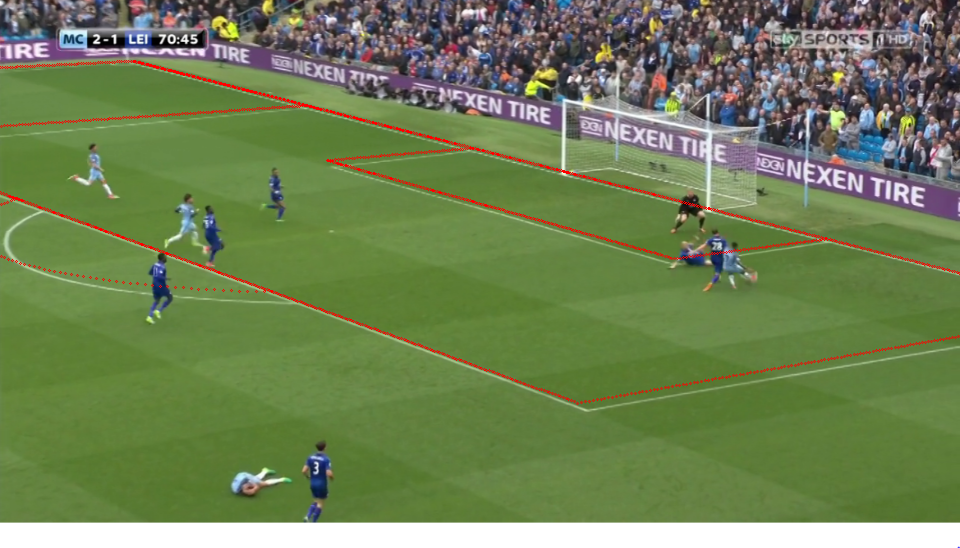

In [165]:
from baseline_cameras import draw_pitch_homography

cv_image = draw_pitch_homography(rgbimage, homography1)
homography_pil = Image.fromarray(cv_image)
homography_pil


Get camera parameters.

In [216]:
cam1 = Camera(960, 540)
success = cam1.from_homography(homography1)
cam1.to_json_parameters()

{'pan_degrees': np.float64(39.58685326315575),
 'tilt_degrees': np.float64(77.45135224091236),
 'roll_degrees': np.float64(-2.9505414900239426),
 'position_meters': [6.793207798098928,
  55.115773485518154,
  -13.84944684188016],
 'x_focal_length': np.float64(2395.634337137059),
 'y_focal_length': np.float64(2395.634337137643),
 'principal_point': [480.0, 270.0],
 'radial_distortion': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
 'tangential_distortion': [0.0, 0.0],
 'thin_prism_distortion': [0.0, 0.0, 0.0, 0.0]}

Using the estimated camera position and parameters, view the 3D space from there.

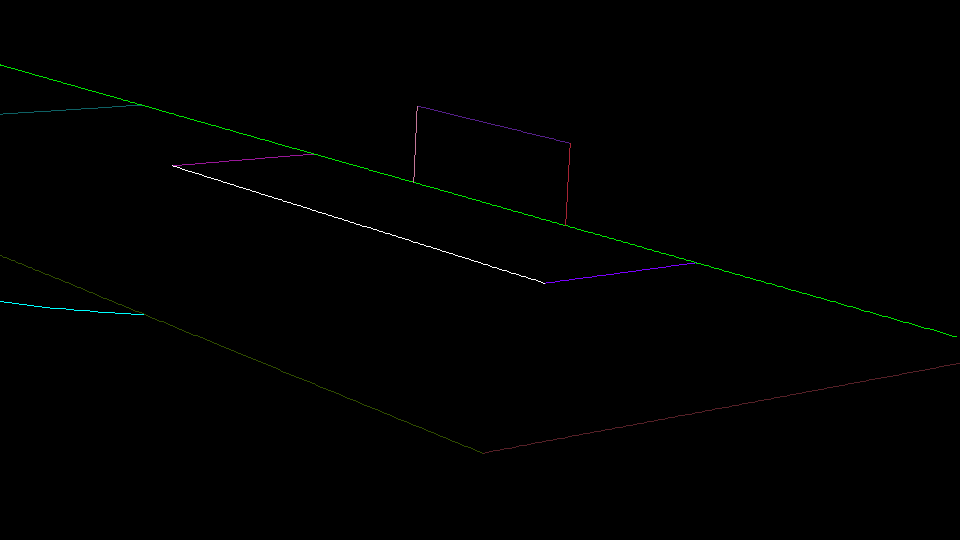

In [217]:
black_img = np.zeros((540, 960, 3), dtype=np.uint8)
cam1.draw_colorful_pitch(black_img, SoccerPitch.palette)
rgb_model = cv2.cvtColor(black_img, cv2.COLOR_BGR2RGB)
pitch_model = Image.fromarray(rgb_model)
pitch_model

In [218]:
image = cv2.imread("../images/img1.PNG")
image = cv2.resize(image, (960, 548))
rgbimage = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

Construct the projection matrix from the computed parameters.

In [226]:
import numpy as np
from scipy.spatial.transform import Rotation as R

def build_projection_matrix(params):
    fx = params['x_focal_length']
    fy = params['y_focal_length']
    cx, cy = params['principal_point']
    pan = np.radians(params['pan_degrees'])
    tilt = np.radians(params['tilt_degrees'])
    roll = np.radians(params['roll_degrees'])
    C = np.array(params['position_meters'])

    K = np.array([
        [fx,  0, cx],
        [ 0, fy, cy],
        [ 0,  0,  1]
    ])

    R_matrix = pan_tilt_roll_to_orientation(pan, tilt, roll).T
    t = -R_matrix @ C.reshape((3, 1))
    Rt = np.hstack((R_matrix, t))

    P = K @ Rt
    return P

P1 = build_projection_matrix(cam1.to_json_parameters())
print(P1)

[[2.39563434e+03 0.00000000e+00 4.80000000e+02]
 [0.00000000e+00 2.39563434e+03 2.70000000e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]
[[ 2.15941573e+03  1.14286003e+03 -1.60780826e+01 -7.78816471e+04]
 [-6.82660927e+01  2.76066454e+02  2.39396970e+03  1.84032857e+04]
 [ 6.22024541e-01 -7.52249879e-01  2.17268473e-01  4.02443401e+01]]


Project the regulatory pitch in the image using the projection matrix.

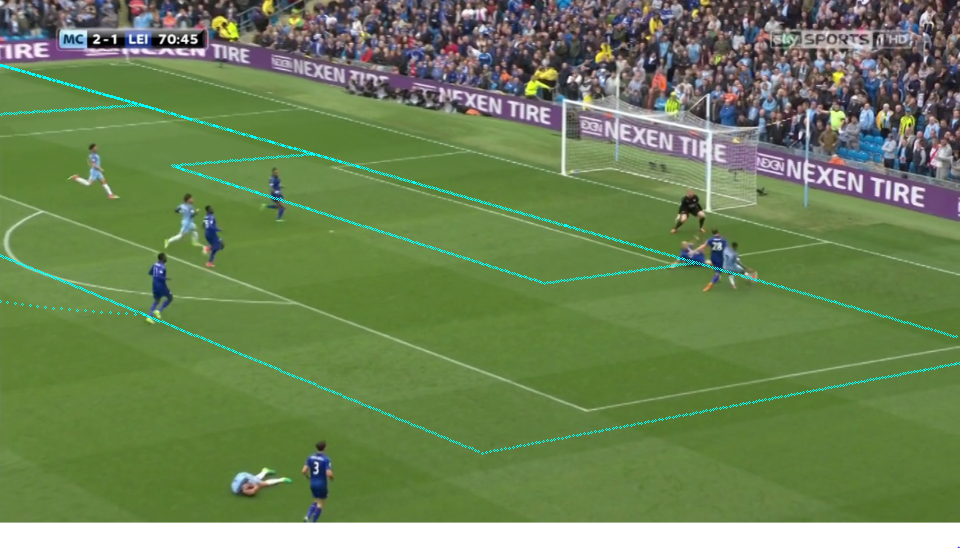

In [225]:
def draw_pitch_projection_matrix(image, projection_matrix):
    """
    Draws points along the soccer pitch using a full 3x4 camera projection matrix M (P = K[R|t]).
    This function assumes that the pitch lies on the plane z=0 in world coordinates.

    :param image: the image to draw on
    :param projection_matrix: 3x4 camera projection matrix
    :return: modified image
    """
    field = SoccerPitch()
    polylines = field.sample_field_points()

    for line in polylines.values():
        for point in line:
            # We assume the pitch is at z = 0, so use only x, y
            if point[2] == 0.:
                X = np.array([point[0], point[1], 0., 1.])  # homogeneous 3D point with z = 0
                projected = X @ projection_matrix.T
                if projected[2] == 0.:
                    continue
                projected /= projected[2]
                x_img, y_img = projected[0], projected[1]                # Make sure it's in bounds
                if 0 <= x_img < image.shape[1] and 0 <= y_img < image.shape[0]:
                    cv2.circle(image, (int(x_img), int(y_img)), 1, (0, 255, 255), 1)

    return image


cv_image = draw_pitch_projection_matrix(rgbimage, P1)
homography_pil = Image.fromarray(cv_image)
homography_pil

# IMAGE 2

Repeat the process for the second view.

(548, 960, 3)


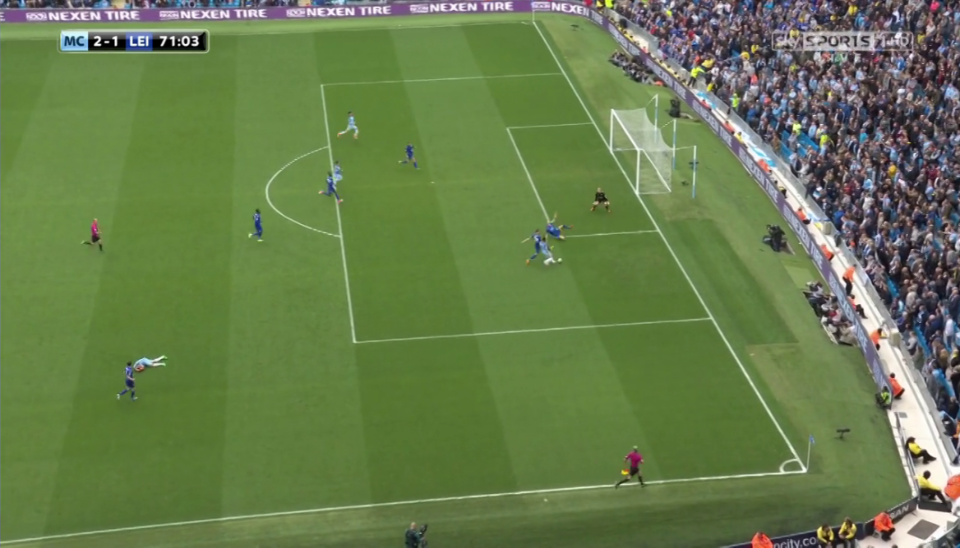

In [227]:
from PIL import Image
import cv2

image = cv2.imread("../images/img2.PNG")
image = cv2.resize(image, (960, 548))
print(image.shape)
rgbimage = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
pil_image = Image.fromarray(rgbimage)
pil_image

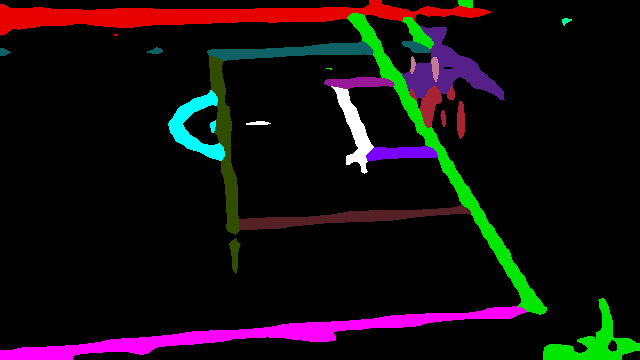

In [228]:
import numpy as np

seg_mask = seg_net.analyse_image(image)
mask = Image.fromarray(seg_mask.astype(np.uint8)).convert('P')
mask.putpalette(lines_palette)
mask

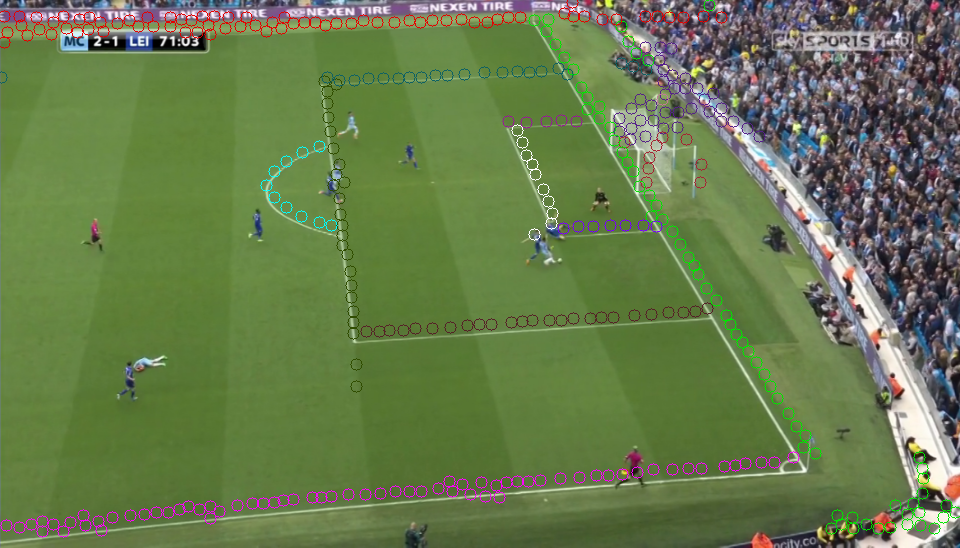

In [229]:
from detect_extremities import generate_class_synthesis, get_line_extremities

skeletons = generate_class_synthesis(seg_mask, 6)
circles_image = rgbimage.copy()
for k, circle_list in skeletons.items():
  color = SoccerPitch.palette[k]

  for circle_center in circle_list:
    cv2.circle(circles_image, (int(circle_center[1] * 548. / 360.), int(circle_center[0] * 960. / 648.)), 6, color, 1)

skeletons_image = Image.fromarray(circles_image)
skeletons_image

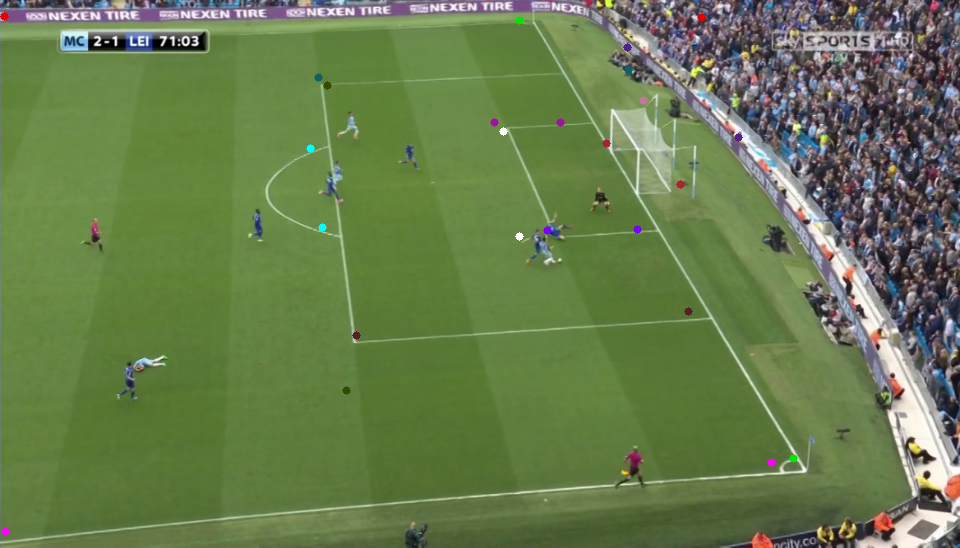

In [230]:
extremities_image = rgbimage.copy()
extremities = get_line_extremities(skeletons, 40, 648, 360)

for k, ends in extremities.items():
  color = SoccerPitch.palette[k]
  start = (int(ends[0]['x'] * 959.), int(ends[0]['y'] * 539.))
  end = (int(ends[1]['x'] * 959.), int(ends[1]['y'] * 539.))
  cv2.circle(extremities_image, start, 4, color, -1)
  cv2.circle(extremities_image, end, 4, color, -1)

extremities_pil = Image.fromarray(extremities_image)
extremities_pil

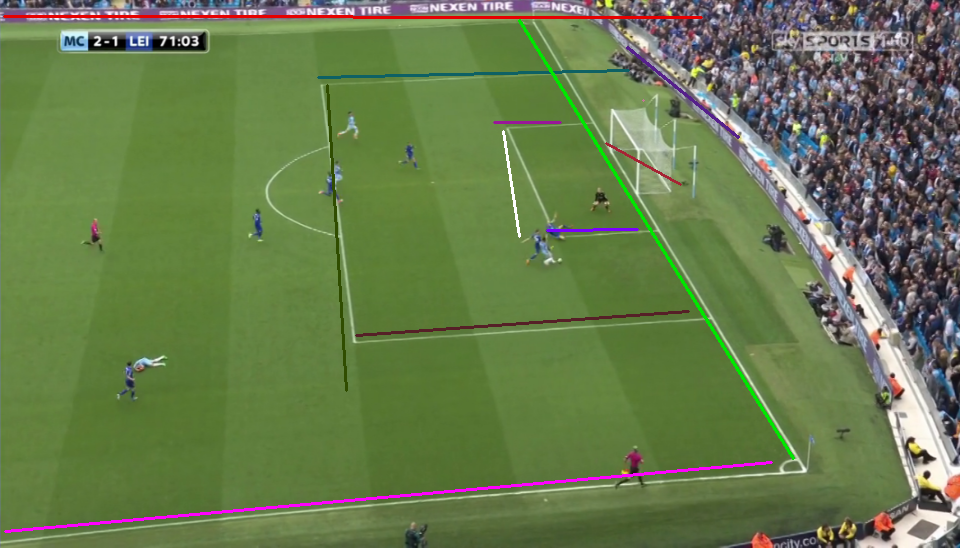

In [231]:
extremities_image = rgbimage.copy()
extremities = get_line_extremities(skeletons, 40, 648, 360)

pitch = SoccerPitch()
line_matches = []
for k, ends in extremities.items():
  if "Circle" in k:
    continue
  color = SoccerPitch.palette[k]
  start = (int(ends[0]['x'] * 959.), int(ends[0]['y'] * 539.))
  end = (int(ends[1]['x'] * 959.), int(ends[1]['y'] * 539.))
  cv2.line(extremities_image, start, end, color, 2)

  line = np.cross([start[0], start[1], 1], [end[0], end[1], 1])
  if np.isnan(np.sum(line)) or np.isinf(np.sum(line)):
    continue
  line_pitch = pitch.get_2d_homogeneous_line(k)
  if line_pitch is not None:
    line_matches.append((line_pitch, line))

extremities_pil = Image.fromarray(extremities_image)
extremities_pil

In [232]:
def estimate_homography_from_line_correspondences(lines, T1=np.eye(3), T2=np.eye(3)):
    """
    Given lines correspondences, computes the homography that maps best the two set of lines.
    :param lines: list of pair of 2D lines matches.
    :param T1: Similarity transform to normalize the elements of the source reference system
    :param T2: Similarity transform to normalize the elements of the target reference system
    :return: boolean to indicate success or failure of the estimation, homography
    """
    homography = np.eye(3)
    A = np.zeros((len(lines) * 2, 9))

    for i, line_pair in enumerate(lines):
        src_line = np.transpose(np.linalg.inv(T1)) @ line_pair[0]
        target_line = np.transpose(np.linalg.inv(T2)) @ line_pair[1]
        u = src_line[0]
        v = src_line[1]
        w = src_line[2]

        x = target_line[0]
        y = target_line[1]
        z = target_line[2]

        A[2 * i, 0] = 0
        A[2 * i, 1] = x * w
        A[2 * i, 2] = -x * v
        A[2 * i, 3] = 0
        A[2 * i, 4] = y * w
        A[2 * i, 5] = -v * y
        A[2 * i, 6] = 0
        A[2 * i, 7] = z * w
        A[2 * i, 8] = -v * z

        A[2 * i + 1, 0] = x * w
        A[2 * i + 1, 1] = 0
        A[2 * i + 1, 2] = -x * u
        A[2 * i + 1, 3] = y * w
        A[2 * i + 1, 4] = 0
        A[2 * i + 1, 5] = -u * y
        A[2 * i + 1, 6] = z * w
        A[2 * i + 1, 7] = 0
        A[2 * i + 1, 8] = -u * z

    try:
        u, s, vh = np.linalg.svd(A)
    except np.linalg.LinAlgError:
        return False, homography
    v = np.eye(3)
    has_positive_singular_value = False
    for i in range(s.shape[0] - 1, -2, -1):
        v = np.reshape(vh[i], (3, 3))

        if s[i] > 0:
            has_positive_singular_value = True
            break

    if not has_positive_singular_value:
        return False, homography

    homography = np.reshape(v, (3, 3))
    homography = np.linalg.inv(T2) @ homography @ T1
    homography /= homography[2, 2]

    return True, homography

success, homography2 = estimate_homography_from_line_correspondences(line_matches)
homography2

array([[ 2.11380695e+01, -3.89730220e+00, -3.87338740e+02],
       [ 9.24027628e-02,  4.61458092e+00,  1.80000734e+02],
       [ 3.75897715e-03, -1.33631858e-02,  1.00000000e+00]])

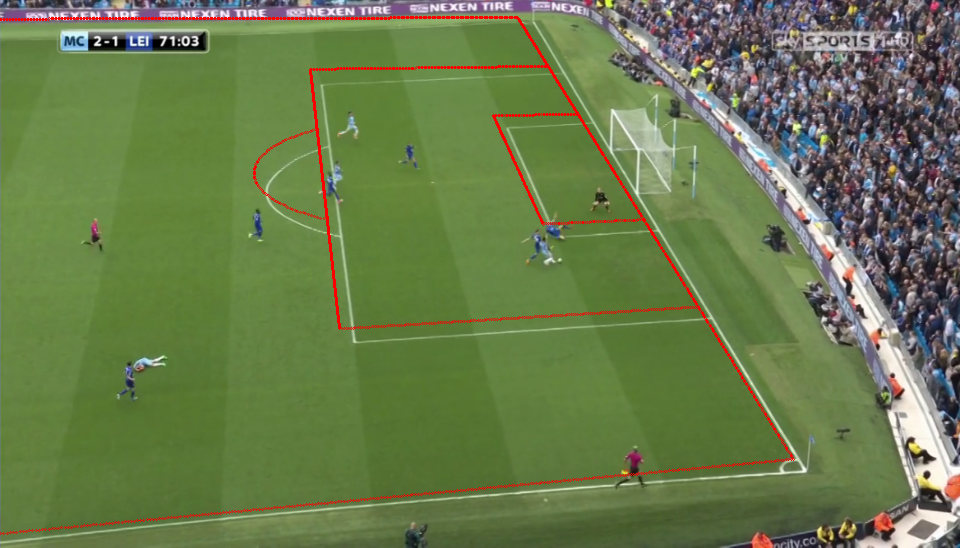

In [51]:
from baseline_cameras import draw_pitch_homography

cv_image = draw_pitch_homography(rgbimage, homography2)
homography_pil = Image.fromarray(cv_image)
homography_pil

In [233]:
cam2 = Camera(960, 548)
success = cam2.from_homography(homography2)
cam2.to_json_parameters()

{'pan_degrees': np.float64(12.256023766671259),
 'tilt_degrees': np.float64(63.52770757076378),
 'roll_degrees': np.float64(-3.968694262449086),
 'position_meters': [32.309958699123015,
  65.99567990076406,
  -26.72876263285576],
 'x_focal_length': np.float64(1214.5095125477403),
 'y_focal_length': np.float64(1214.5095125477112),
 'principal_point': [480.0, 274.0],
 'radial_distortion': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
 'tangential_distortion': [0.0, 0.0],
 'thin_prism_distortion': [0.0, 0.0, 0.0, 0.0]}

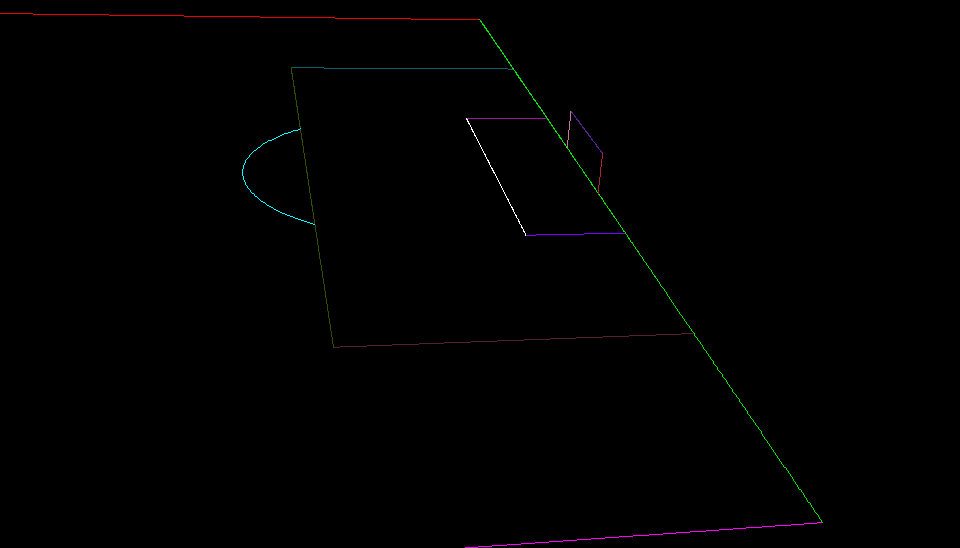

In [234]:
black_img = np.zeros((548, 960, 3), dtype=np.uint8)
cam2.draw_colorful_pitch(black_img, SoccerPitch.palette)
rgb_model = cv2.cvtColor(black_img, cv2.COLOR_BGR2RGB)
pitch_model = Image.fromarray(rgb_model)
pitch_model

In [235]:
def build_projection_matrix(params):
    fx = params['x_focal_length']
    fy = params['y_focal_length']
    cx, cy = params['principal_point']
    pan = np.radians(params['pan_degrees'])
    tilt = np.radians(params['tilt_degrees'])
    roll = np.radians(params['roll_degrees'])
    C = np.array(params['position_meters'])

    K = np.array([
        [fx,  0, cx],
        [ 0, fy, cy],
        [ 0,  0,  1]
    ])

    R_matrix = pan_tilt_roll_to_orientation(pan, tilt, roll).T
    t = -R_matrix @ C.reshape((3, 1))
    Rt = np.hstack((R_matrix, t))

    P = K @ Rt
    return P

P2 = build_projection_matrix(cam2.to_json_parameters())
print(P2)

[[ 1.28314849e+03 -1.99297018e+02  1.38722749e+02 -2.45978451e+04]
 [ 1.95583691e+01  3.05941091e+02  1.20670082e+03  1.14308994e+04]
 [ 1.90022818e-01 -8.74748484e-01  4.45764981e-01  6.35047379e+01]]


In [239]:
image = cv2.imread("../images/img2.PNG")
image = cv2.resize(image, (960, 548))
rgbimage = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

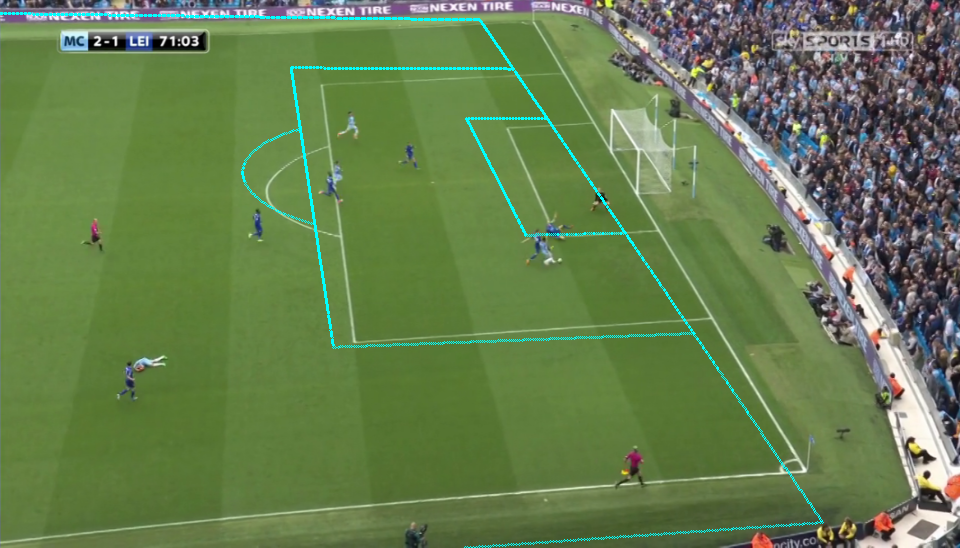

In [240]:
def draw_pitch_projection_matrix(image, projection_matrix):
    """
    Draws points along the soccer pitch using a full 3x4 camera projection matrix M (P = K[R|t]).
    This function assumes that the pitch lies on the plane z=0 in world coordinates.

    :param image: the image to draw on
    :param projection_matrix: 3x4 camera projection matrix
    :return: modified image
    """
    field = SoccerPitch()
    polylines = field.sample_field_points()

    for line in polylines.values():
        for point in line:
            # We assume the pitch is at z = 0, so use only x, y
            if point[2] == 0.:
                X = np.array([point[0], point[1], 0., 1.])  # homogeneous 3D point with z = 0
                projected = projection_matrix @ X
                if projected[2] == 0.:
                    continue
                projected /= projected[2]
                x_img, y_img = projected[0], projected[1]

                # Make sure it's in bounds
                if 0 <= x_img < image.shape[1] and 0 <= y_img < image.shape[0]:
                    cv2.circle(image, (int(x_img), int(y_img)), 1, (0, 255, 255), 1)

    return image


cv_image = draw_pitch_projection_matrix(rgbimage, P2)
homography_pil = Image.fromarray(cv_image)
homography_pil

In [241]:
img1 = cv2.imread("../images/img1.PNG")
img1 = cv2.resize(img1, (960, 548))
img2 = cv2.imread("../images/img2.PNG")
img2 = cv2.resize(img2, (960, 548))

### Pose estimation model

In [ ]:
from torchvision import models
import torch

# pose detection model
model = models.detection.keypointrcnn_resnet50_fpn(pretrained=True)
model.eval()

In [243]:
def get_keypoints(img):
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_tensor = torch.tensor(img_rgb).permute(2, 0, 1).unsqueeze(0).float() / 255.0

    with torch.no_grad():
        output = model(img_tensor)

    keypoints = []
    for i in range(len(output[0]['keypoints'])):
        keypoints.append(output[0]['keypoints'][i].cpu().numpy())  # List of keypoints for all people

    return keypoints

# Get keypoints for all 3 images
keypoints1 = get_keypoints(img1)
keypoints2 = get_keypoints(img2)

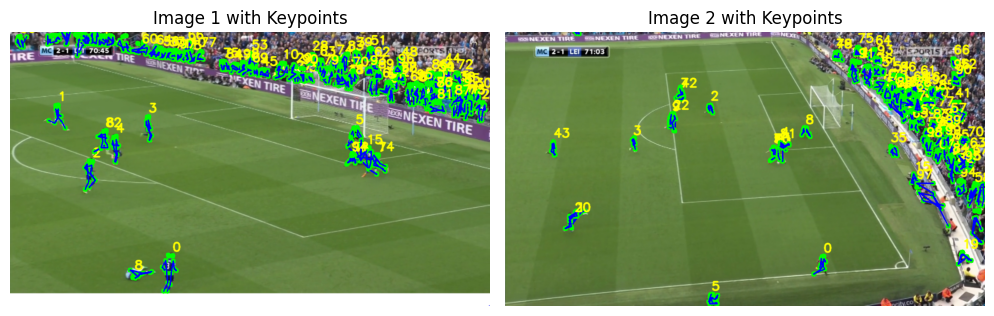

In [244]:
def visualize_keypoints(img, keypoints_list, skeleton, player_numbers=None):
    img_copy = img.copy()

    for i, keypoints in enumerate(keypoints_list):
        # Draw keypoints
        for point in keypoints:
            if not np.any(np.isnan(point)):
                cv2.circle(img_copy, (int(point[0]), int(point[1])), 5, (0, 255, 0), -1)

        # Draw skeleton
        for joint1, joint2 in skeleton:
            if not np.any(np.isnan(keypoints[joint1])) and not np.any(np.isnan(keypoints[joint2])):
                point1 = keypoints[joint1]
                point2 = keypoints[joint2]
                cv2.line(img_copy, (int(point1[0]), int(point1[1])), (int(point2[0]), int(point2[1])), (255, 0, 0), 2)

        head = keypoints[0]  # assuming keypoint[0] is the head/nose
        if not np.any(np.isnan(head)):
            cv2.putText(img_copy, str(i), (int(head[0]), int(head[1]) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 255), 2, cv2.LINE_AA)

    return img_copy


skeleton = [
    (5, 7), (7, 9),   # Right arm
    (6, 8), (8, 10),  # Left arm
    (5, 11), (6, 12), # Torso sides
    (11, 13), (13, 15), # Right leg
    (12, 14), (14, 16)  # Left leg
]

img1_with_keypoints = visualize_keypoints(img1, keypoints1, skeleton)
img2_with_keypoints = visualize_keypoints(img2, keypoints2, skeleton)

plt.figure(figsize=(15, 15))

# Plot for img1
plt.subplot(131)
plt.imshow(cv2.cvtColor(img1_with_keypoints, cv2.COLOR_BGR2RGB))
plt.title('Image 1 with Keypoints')
plt.axis('off')

# Plot for img2
plt.subplot(132)
plt.imshow(cv2.cvtColor(img2_with_keypoints, cv2.COLOR_BGR2RGB))
plt.title('Image 2 with Keypoints')
plt.axis('off')

plt.tight_layout()
plt.show()


Manually match players. During a game, we would be tracking players from the beginning to easily find correspondences.

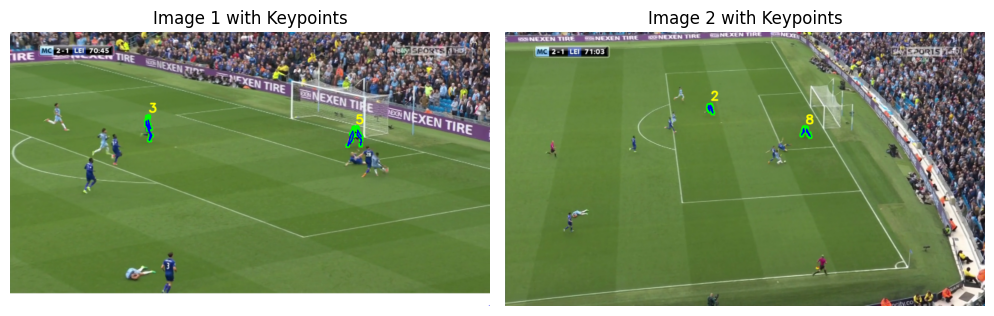

In [257]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def visualize_keypoints(img, keypoints_list, skeleton, players):
    img_copy = img.copy()  # Create a copy of the image
    updated_keypoints_list = []  # Initialize a list to store the processed keypoints

    for i, keypoints in enumerate(keypoints_list):
        if i in players:
            # Draw keypoints
            for point in keypoints:
                if not np.any(np.isnan(point)):
                    updated_keypoints_list.append((int(point[0]), int(point[1])))  # Append each keypoint
                    cv2.circle(img_copy, (int(point[0]), int(point[1])), 5, (0, 255, 0), -1)

            # Draw skeleton
            for joint1, joint2 in skeleton:
                if not np.any(np.isnan(keypoints[joint1])) and not np.any(np.isnan(keypoints[joint2])):
                    point1 = keypoints[joint1]
                    point2 = keypoints[joint2]
                    cv2.line(img_copy, (int(point1[0]), int(point1[1])), (int(point2[0]), int(point2[1])), (255, 0, 0), 2)

            # Draw player index near the head
            head = keypoints[0]  # Assuming keypoint[0] is the head/nose
            if not np.any(np.isnan(head)):
                cv2.putText(img_copy, str(i), (int(head[0]), int(head[1]) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 255), 2, cv2.LINE_AA)

    return img_copy, updated_keypoints_list


# Skeleton connections (you can customize this depending on your dataset)
skeleton = [
    (5, 7), (7, 9),   # Right arm
    (6, 8), (8, 10),  # Left arm
    (5, 11), (6, 12), # Torso sides
    (11, 13), (13, 15), # Right leg
    (12, 14), (14, 16)  # Left leg
]

# List of players (indices referring to players in the keypoints list)
players1 = [5, 3]
players2 = [8, 2]

# Visualizing keypoints on both images
img1_with_keypoints, updated_keypoints1 = visualize_keypoints(img1, keypoints1, skeleton, players1)
img2_with_keypoints, updated_keypoints2 = visualize_keypoints(img2, keypoints2, skeleton, players2)

# Plot the images
plt.figure(figsize=(15, 15))

# Plot for img1
plt.subplot(131)
plt.imshow(cv2.cvtColor(img1_with_keypoints, cv2.COLOR_BGR2RGB))
plt.title('Image 1 with Keypoints')
plt.axis('off')

# Plot for img2
plt.subplot(132)
plt.imshow(cv2.cvtColor(img2_with_keypoints, cv2.COLOR_BGR2RGB))
plt.title('Image 2 with Keypoints')
plt.axis('off')

plt.tight_layout()
plt.show()

In [258]:
print(updated_keypoints1)
print(updated_keypoints2)

[(277, 171), (277, 170), (276, 170), (277, 170), (274, 171), (276, 177), (272, 179), (278, 186), (272, 187), (281, 194), (276, 193), (278, 196), (276, 196), (280, 208), (283, 208), (278, 217), (279, 217), (691, 194), (692, 192), (689, 192), (694, 192), (687, 193), (695, 197), (685, 199), (698, 204), (682, 205), (702, 210), (675, 228), (694, 207), (686, 208), (702, 216), (683, 218), (701, 227), (675, 228)]
[(411, 147), (411, 147), (410, 147), (411, 147), (410, 147), (410, 148), (407, 148), (413, 152), (406, 152), (415, 162), (407, 156), (411, 153), (408, 154), (412, 157), (408, 155), (415, 163), (409, 159), (601, 194), (601, 192), (599, 193), (603, 193), (598, 192), (603, 195), (597, 194), (610, 210), (596, 197), (608, 204), (596, 200), (603, 200), (598, 200), (606, 203), (594, 204), (607, 207), (593, 207)]


In [259]:
points_3d = []

for (x1, y1), (x2, y2) in zip(updated_keypoints1, updated_keypoints2):
    p1 = np.array([x1, y1], dtype=np.float64)
    p2 = np.array([x2, y2], dtype=np.float64)
    point_4d = cv2.triangulatePoints(P1, P2, p1, p2)  # shape: (4,)
    point_3d = (point_4d[:3] / point_4d[3]).flatten()  # shape: (3,)
    points_3d.append(point_3d)

points_3d = np.array(points_3d)  # shape: (N, 3)
print("Triangulated 3D Points:", len(points_3d))
print(points_3d)

Triangulated 3D Points: 34
[[41.51720369  4.58137671 -2.72798032]
 [41.50909805  4.59517363 -2.75268477]
 [41.44943297  4.6357905  -2.76492334]
 [41.50909805  4.59517363 -2.75268477]
 [41.46724828  4.51985318 -2.71802961]
 [41.49002708  4.57034203 -2.58841029]
 [41.33163979  4.61462201 -2.56528384]
 [41.68466294  4.39464344 -2.30123147]
 [41.26804014  4.71957258 -2.37739196]
 [41.7058174   4.56208348 -2.05325213]
 [41.29838134  4.87138704 -2.23647753]
 [41.61864333  4.47435468 -2.09739056]
 [41.4176568   4.67934774 -2.14472959]
 [41.70698652  4.44370002 -1.78194648]
 [41.46051843  4.91044485 -1.92586766]
 [41.89403616  4.11747748 -1.43307336]
 [41.55488121  4.61213267 -1.6147268 ]
 [50.5738462  10.64097821 -2.46132226]
 [50.5724186  10.66616183 -2.53159948]
 [50.44635163 10.68977169 -2.53505644]
 [50.67778148 10.64118778 -2.50845006]
 [50.42568989 10.63015599 -2.51165862]
 [50.68740497 10.67781119 -2.3857508 ]
 [50.41004309 10.58237944 -2.35004009]
 [50.99100391 10.59037283 -2.03459009

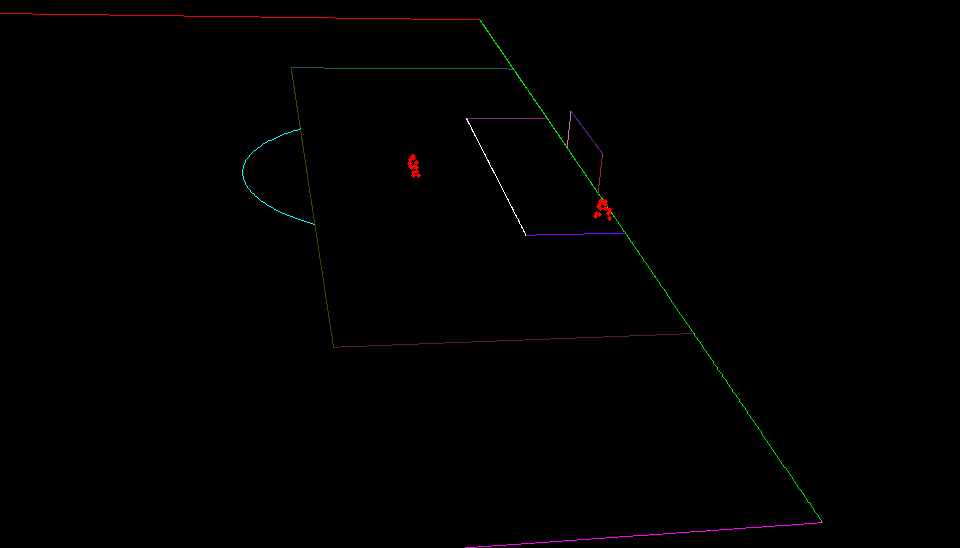

In [262]:
def draw_colorful_pitch(image, palette, cam, players):
    """
    Draws all the lines of the pitch and player points on the image.

    :param image: image to draw on
    :param palette: dict mapping pitch elements to BGR colors
    :param cam: Camera object used to project 3D points
    :param players: list of 3D points (Nx3) to draw as circles
    :return: image with pitch lines and player points
    """
    field = SoccerPitch()
    polylines = field.sample_field_points()

    # Draw pitch lines
    for key, line in polylines.items():
        if key not in palette:
            print(f"Can't draw {key}")
            continue
        prev_point = cam.project_point(line[0])
        for point in line[1:]:
            projected = cam.project_point(point)
            if projected[2] == 0.:
                continue
            projected /= projected[2]
            if 0 < projected[0] < cam.image_width and 0 < projected[1] < cam.image_height:
                cv2.line(image, (int(prev_point[0]), int(prev_point[1])),
                         (int(projected[0]), int(projected[1])),
                         palette[key][::-1], 1)
            prev_point = projected

    # Draw 3D player points as red circles
    for point in players:
        projected = cam.project_point(point)
        if projected[2] != 0:
            projected /= projected[2]
            u, v = int(projected[0]), int(projected[1])
            if 0 <= u < cam.image_width and 0 <= v < cam.image_height:
                cv2.circle(image, (u, v), radius=2, color=(0, 0, 255), thickness=-1)  # red dot

    return image
black_img = np.zeros((548, 960, 3), dtype=np.uint8)
draw_colorful_pitch(black_img, SoccerPitch.palette, cam2, points_3d)

rgb_model = cv2.cvtColor(black_img, cv2.COLOR_BGR2RGB)
pitch_model = Image.fromarray(rgb_model)
pitch_model

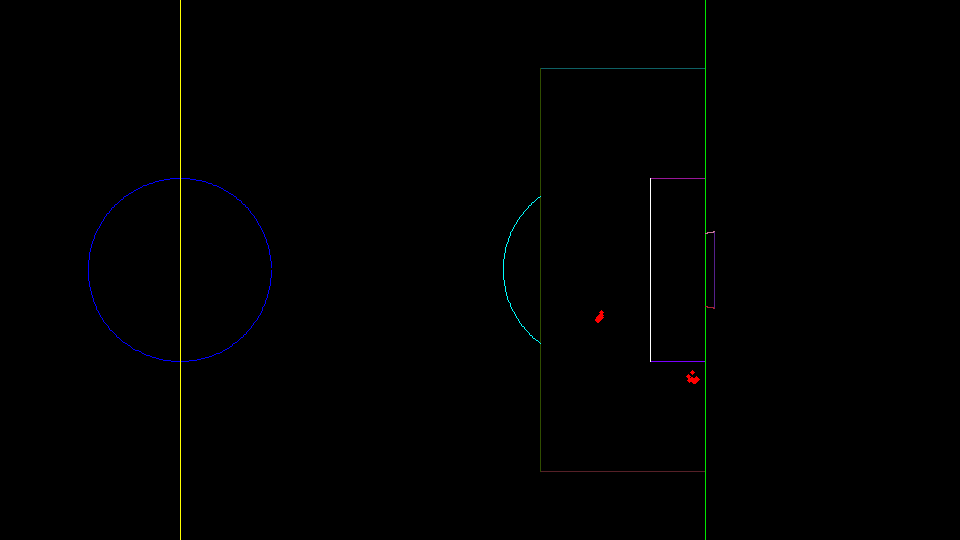

In [265]:
def draw_colorful_pitch(image, palette, cam, players):
    """
    Draws all the lines of the pitch and player points on the image.

    :param image: image to draw on
    :param palette: dict mapping pitch elements to BGR colors
    :param cam: Camera object used to project 3D points
    :param players: list of 3D points (Nx3) to draw as circles
    :return: image with pitch lines and player points
    """
    field = SoccerPitch()
    polylines = field.sample_field_points()

    # Draw pitch lines
    for key, line in polylines.items():
        if key not in palette:
            print(f"Can't draw {key}")
            continue
        prev_point = cam.project_point(line[0])
        for point in line[1:]:
            projected = cam.project_point(point)
            if projected[2] == 0.:
                continue
            projected /= projected[2]
            if 0 < projected[0] < cam.image_width and 0 < projected[1] < cam.image_height:
                cv2.line(image, (int(prev_point[0]), int(prev_point[1])),
                         (int(projected[0]), int(projected[1])),
                         palette[key][::-1], 1)
            prev_point = projected

    # Draw 3D player points as red circles
    for point in players:
        projected = cam.project_point(point)
        if projected[2] != 0:
            projected /= projected[2]
            u, v = int(projected[0]), int(projected[1])
            if 0 <= u < cam.image_width and 0 <= v < cam.image_height:
                cv2.circle(image, (u, v), radius=2, color=(0, 0, 255), thickness=-1)  # red dot

    return image

camera = Camera(960, 540)
camera.xfocal_length = 600
camera.yfocal_length = 600
camera.position = [30, 0, -60]
black_img = np.zeros((540, 960, 3), dtype=np.uint8)
draw_colorful_pitch(black_img, SoccerPitch.palette, camera, points_3d)

rgb_model = cv2.cvtColor(black_img, cv2.COLOR_BGR2RGB)
pitch_model = Image.fromarray(rgb_model)
pitch_model